In [447]:
# Importing necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
import geopandas as gpd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor

#### Loading the data and understanding it's format

In [448]:
df = pd.read_csv('Data/Airbnb_Open_Data.csv')

/var/folders/yp/fsg4g4q540sbv26cv4z4drnr0000gn/T/ipykernel_20876/383677341.py:1: DtypeWarning:

Columns (25) have mixed types. Specify dtype option on import or set low_memory=False.



In [449]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 102599 entries, 0 to 102598
Data columns (total 26 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   id                              102599 non-null  int64  
 1   NAME                            102349 non-null  object 
 2   host id                         102599 non-null  int64  
 3   host_identity_verified          102310 non-null  object 
 4   host name                       102193 non-null  object 
 5   neighbourhood group             102570 non-null  object 
 6   neighbourhood                   102583 non-null  object 
 7   lat                             102591 non-null  float64
 8   long                            102591 non-null  float64
 9   country                         102067 non-null  object 
 10  country code                    102468 non-null  object 
 11  instant_bookable                102494 non-null  object 
 12  cancellation_pol

In [450]:
df.head(10)

,id,NAME,host id,host_identity_verified,host name,neighbourhood group,neighbourhood,lat,long,country,...,service fee,minimum nights,number of reviews,last review,reviews per month,review rate number,calculated host listings count,availability 365,house_rules,license
0,1001254,Clean & quiet apt home by the park,80014485718,unconfirmed,Madaline,Brooklyn,Kensington,40.64749,-73.97237,United States,...,$193,10.0,9.0,10/19/2021,0.21,4.0,6.0,286.0,Clean up and treat the home the way you'd like...,NaN
1,1002102,Skylit Midtown Castle,52335172823,verified,Jenna,Manhattan,Midtown,40.75362,-73.98377,United States,...,$28,30.0,45.0,5/21/2022,0.38,4.0,2.0,228.0,Pet friendly but please confirm with me if the...,NaN
2,1002403,THE VILLAGE OF HARLEM....NEW YORK !,78829239556,NaN,Elise,Manhattan,Harlem,40.80902,-73.94190,United States,...,$124,3.0,0.0,NaN,NaN,5.0,1.0,352.0,"I encourage you to use my kitchen, cooking and...",NaN
3,1002755,NaN,85098326012,unconfirmed,Garry,Brooklyn,Clinton Hill,40.68514,-73.95976,United States,...,$74,30.0,270.0,7/5/2019,4.64,4.0,1.0,322.0,NaN,NaN
4,1003689,Entire Apt: Spacious Studio/Loft by central park,92037596077,verified,Lyndon,Manhattan,East Harlem,40.79851,-73.94399,United States,...,$41,10.0,9.0,11/19/2018,0.10,3.0,1.0,289.0,"Please no smoking in the house, porch or on th...",NaN
5,1004098,Large Cozy 1 BR Apartment In Midtown East,45498551794,verified,Michelle,Manhattan,Murray Hill,40.74767,-73.97500,United States,...,$115,3.0,74.0,6/22/2019,0.59,3.0,1.0,374.0,"No smoking, please, and no drugs.",NaN
6,1004650,BlissArtsSpace!,61300605564,NaN,Alberta,Brooklyn,Bedford-Stuyvesant,40.68688,-73.95596,United States,...,$14,45.0,49.0,10/5/2017,0.40,5.0,1.0,224.0,Please no shoes in the house so bring slippers...,NaN
7,1005202,BlissArtsSpace!,90821839709,unconfirmed,Emma,Brooklyn,Bedford-Stuyvesant,40.68688,-73.95596,United States,...,$212,45.0,49.0,10/5/2017,0.40,5.0,1.0,219.0,House Guidelines for our BnB We are delighted ...,NaN
8,1005754,Large Furnished Room Near B'way,79384379533,verified,Evelyn,Manhattan,Hell's Kitchen,40.76489,-73.98493,United States,...,$204,2.0,430.0,6/24/2019,3.47,3.0,1.0,180.0,- Please clean up after yourself when using th...,NaN
9,1006307,Cozy Clean Guest Room - Family Apt,75527839483,unconfirmed,Carl,Manhattan,Upper West Side,40.80178,-73.96723,United States,...,$58,2.0,118.0,7/21/2017,0.99,5.0,1.0,375.0,NO SMOKING OR PETS ANYWHERE ON THE PROPERTY 1....,NaN


In [451]:
df.columns, df.dtypes

(Index(['id', 'NAME', 'host id', 'host_identity_verified', 'host name',
        'neighbourhood group', 'neighbourhood', 'lat', 'long', 'country',
        'country code', 'instant_bookable', 'cancellation_policy', 'room type',
        'Construction year', 'price', 'service fee', 'minimum nights',
        'number of reviews', 'last review', 'reviews per month',
        'review rate number', 'calculated host listings count',
        'availability 365', 'house_rules', 'license'],
       dtype='object'),
 id                                  int64
 NAME                               object
 host id                             int64
 host_identity_verified             object
 host name                          object
 neighbourhood group                object
 neighbourhood                      object
 lat                               float64
 long                              float64
 country                            object
 country code                       object
 instant_bookable     

In [452]:
df.shape

(102599, 26)

#### Preprocessing the data :  Handling missing values, checking for nulls, filling values in categorical and numerical columns

In [453]:
df.isnull().sum()

id                                     0
NAME                                 250
host id                                0
host_identity_verified               289
host name                            406
neighbourhood group                   29
neighbourhood                         16
lat                                    8
long                                   8
country                              532
country code                         131
instant_bookable                     105
cancellation_policy                   76
room type                              0
Construction year                    214
price                                247
service fee                          273
minimum nights                       409
number of reviews                    183
last review                        15893
reviews per month                  15879
review rate number                   326
calculated host listings count       319
availability 365                     448
house_rules     

In [454]:
df.duplicated().sum()

541

In [455]:
df.drop_duplicates(inplace=True)


In [456]:
# We can see that there are columns that have extreme number of null values - 
# Removing those if that feature is not related to the price and others which don't affect the price predicition

df['country'].value_counts()

df.drop(columns=['id', 'NAME', 'host id', 'host name', 'license','country','country code', 'last review', 'house_rules', 'neighbourhood'],inplace=True)


In [457]:
df['price'] = pd.to_numeric(df['price'].str.replace('$', '').str.strip(), errors='coerce')
df['service fee'] = pd.to_numeric(df['service fee'].str.replace('$', '').str.strip(), errors='coerce')


print(df[['price', 'service fee']].head())

   price  service fee
0  966.0        193.0
1  142.0         28.0
2  620.0        124.0
3  368.0         74.0
4  204.0         41.0


/var/folders/yp/fsg4g4q540sbv26cv4z4drnr0000gn/T/ipykernel_20876/696705146.py:1: FutureWarning:

The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.

/var/folders/yp/fsg4g4q540sbv26cv4z4drnr0000gn/T/ipykernel_20876/696705146.py:2: FutureWarning:

The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.



In [458]:
df = df.dropna(subset=['price'])

In [459]:
df.head(2)

,host_identity_verified,neighbourhood group,lat,long,instant_bookable,cancellation_policy,room type,Construction year,price,service fee,minimum nights,number of reviews,reviews per month,review rate number,calculated host listings count,availability 365
0,unconfirmed,Brooklyn,40.64749,-73.97237,False,strict,Private room,2020.0,966.0,193.0,10.0,9.0,0.21,4.0,6.0,286.0
1,verified,Manhattan,40.75362,-73.98377,False,moderate,Entire home/apt,2007.0,142.0,28.0,30.0,45.0,0.38,4.0,2.0,228.0


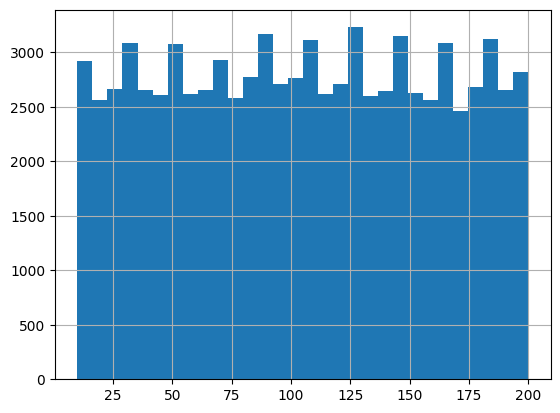

In [460]:
# Checking if values in a column are normally distirbuted to understand how to fill them up eg using median or mode for one example column
df['service fee'].hist(bins=30)
plt.show()

In [461]:
# Using mode to fill na values in categorical columns which have na or empty values

cat_cols = ['host_identity_verified', 'neighbourhood group', 'instant_bookable', 'cancellation_policy', 'room type']

for col in cat_cols:
    df[col].fillna(df[col].mode()[0], inplace=True)

In [462]:
num_cols = ['Construction year', 'service fee', 'minimum nights', 'number of reviews',
                     'reviews per month', 'review rate number', 'calculated host listings count',
                     'availability 365']
for col in num_cols:
    df[col].fillna(df[col].median(), inplace=True)

In [463]:
df.dropna(inplace=True)

In [464]:
df.isnull().sum()

host_identity_verified            0
neighbourhood group               0
lat                               0
long                              0
instant_bookable                  0
cancellation_policy               0
room type                         0
Construction year                 0
price                             0
service fee                       0
minimum nights                    0
number of reviews                 0
reviews per month                 0
review rate number                0
calculated host listings count    0
availability 365                  0
dtype: int64

#### Performing EDA to understand the features that have the maximum impact on the pricing (Research Questions)

In [465]:
df.describe(include=['object', 'bool', 'float'])

,host_identity_verified,neighbourhood group,lat,long,instant_bookable,cancellation_policy,room type,Construction year,price,service fee,minimum nights,number of reviews,reviews per month,review rate number,calculated host listings count,availability 365
count,83992,83992,83992.000000,83992.000000,83992,83992,83992,83992.000000,83992.000000,83992.000000,83992.000000,83992.000000,83992.000000,83992.000000,83992.000000,83992.000000
unique,2,7,NaN,NaN,2,3,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,verified,Manhattan,NaN,NaN,False,moderate,Entire home/apt,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,42153,35983,NaN,NaN,42172,28194,44008,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,40.728268,-73.949702,NaN,NaN,NaN,2012.493202,524.755120,104.940875,8.093080,27.403277,1.272557,3.284956,7.884072,140.814768
std,NaN,NaN,0.055905,0.049560,NaN,NaN,NaN,5.761521,273.447525,54.628757,29.921973,49.377510,1.615951,1.282709,32.201033,134.760953
min,NaN,NaN,40.499790,-74.249840,NaN,NaN,NaN,2003.000000,50.000000,10.000000,-365.000000,0.000000,0.010000,1.000000,1.000000,-10.000000
25%,NaN,NaN,40.688790,-73.982580,NaN,NaN,NaN,2008.000000,288.000000,58.000000,2.000000,1.000000,0.280000,2.000000,1.000000,3.000000
50%,NaN,NaN,40.722350,-73.954515,NaN,NaN,NaN,2012.000000,524.000000,105.000000,3.000000,7.000000,0.740000,3.000000,1.000000,96.000000
75%,NaN,NaN,40.762993,-73.932650,NaN,NaN,NaN,2017.000000,759.000000,152.000000,5.000000,30.000000,1.700000,4.000000,2.000000,268.000000


/var/folders/yp/fsg4g4q540sbv26cv4z4drnr0000gn/T/ipykernel_20876/2348291133.py:3: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



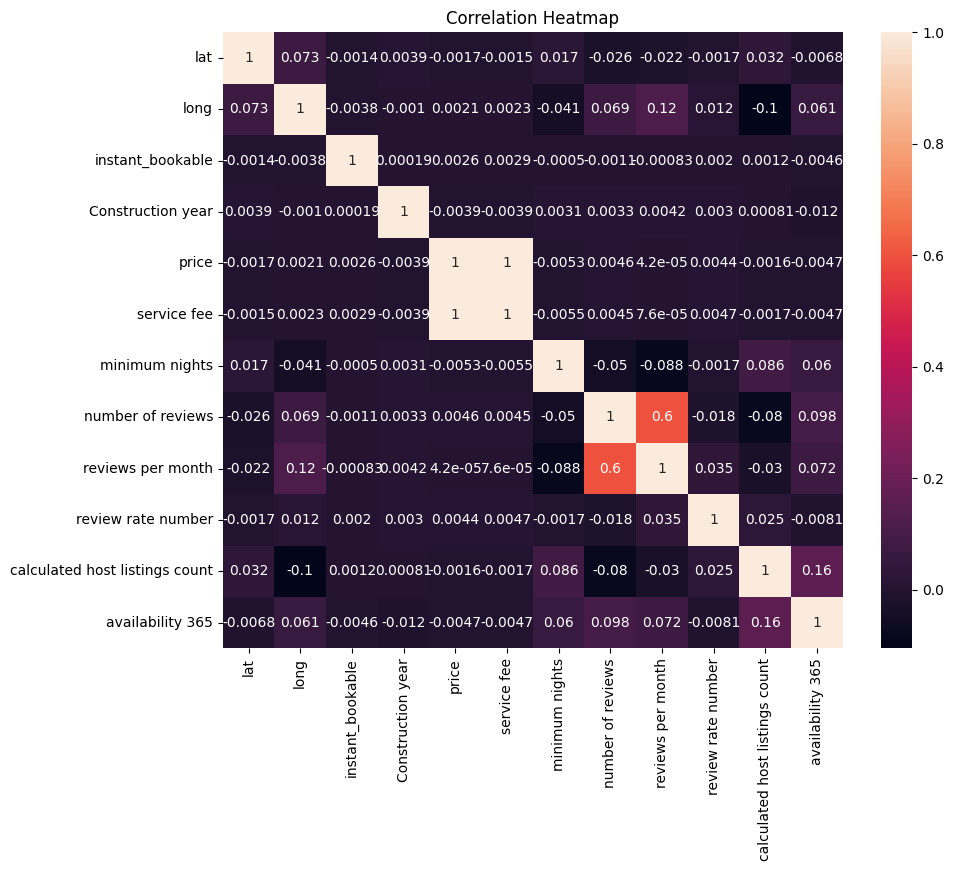

In [466]:
# Generating a correlation matrix heatmap to visualize dependencies between features

df_eda = df.copy(deep=True)
df_eda.dtypes
correlation_matrix = df_eda.corr()

plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True)
plt.title('Correlation Heatmap')
plt.show()


#### On interpreting the heatmap we can observe that one particular attribute, independently does not have a strong affect on the price. It is a combination of factors and the EDA will be performed attribute wise to understand the effect of the location first on the price and then the effect of the individual attributes.

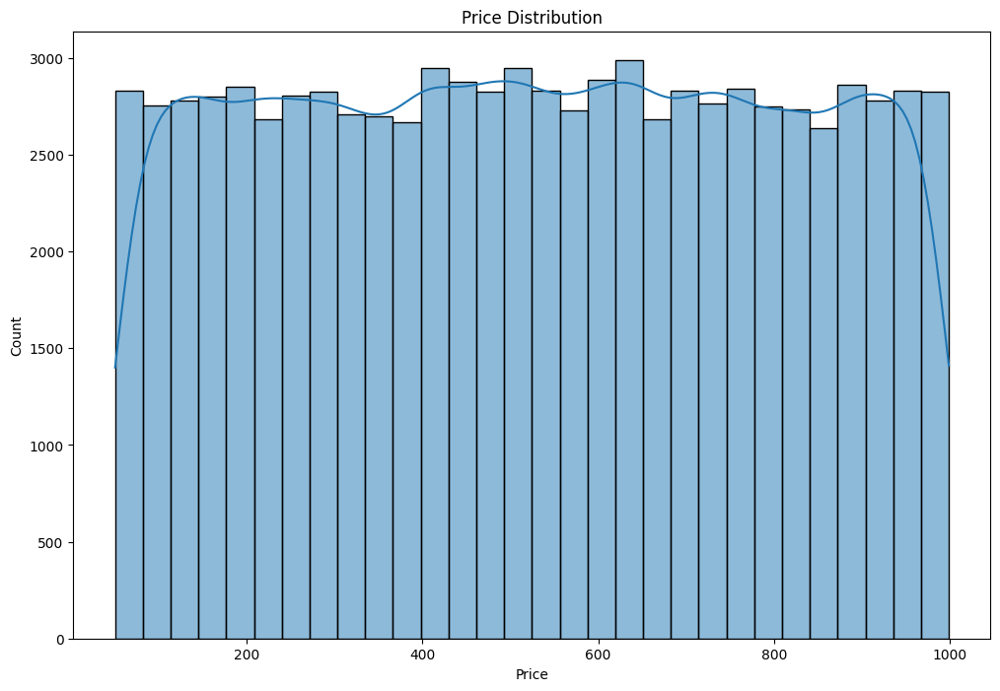

In [468]:
#Understanding the general price distribution in the dataset

plt.figure(figsize=(12, 8))
sns.histplot(df_eda['price'], bins=30, kde=True)
plt.title('Price Distribution')
plt.xlabel('Price')
plt.ylabel('Count')
plt.show()


/var/folders/yp/fsg4g4q540sbv26cv4z4drnr0000gn/T/ipykernel_20876/1292446672.py:3: FutureWarning:



The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.


/var/folders/yp/fsg4g4q540sbv26cv4z4drnr0000gn/T/ipykernel_20876/1292446672.py:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




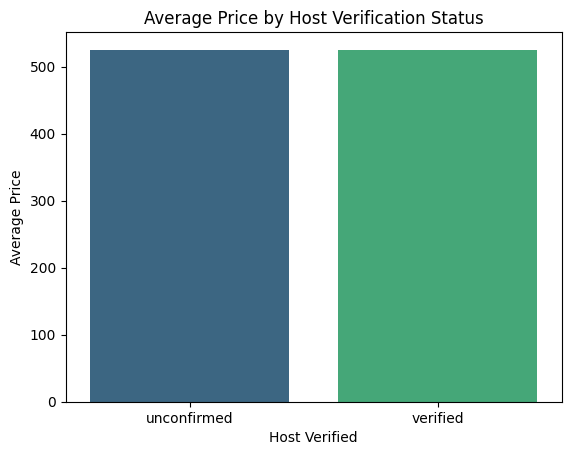

In [469]:
# Looking at the average price based on whether the host is verified or not on Airbnb

sns.barplot(x='host_identity_verified', y='price', data=df_eda, estimator=np.mean, ci=None, palette='viridis')
plt.title('Average Price by Host Verification Status')
plt.xlabel('Host Verified')
plt.ylabel('Average Price')
plt.show()


In [470]:
average_price_by_verification = df.groupby('host_identity_verified')['price'].mean()
print(average_price_by_verification)


host_identity_verified
unconfirmed    525.088745
verified       524.423979
Name: price, dtype: float64


/var/folders/yp/fsg4g4q540sbv26cv4z4drnr0000gn/T/ipykernel_20876/780123971.py:3: FutureWarning:



The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.




/var/folders/yp/fsg4g4q540sbv26cv4z4drnr0000gn/T/ipykernel_20876/780123971.py:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




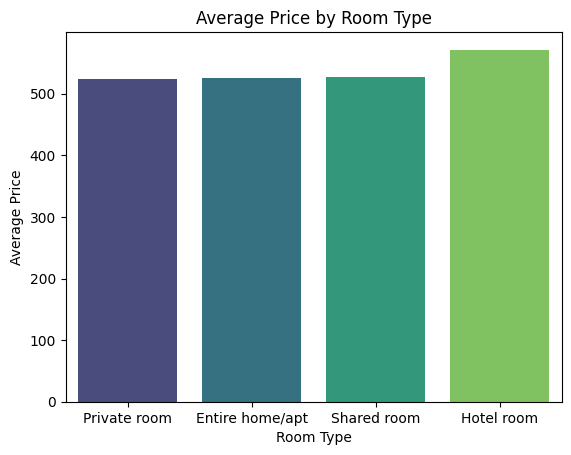

In [471]:
# Observing price variation based on room type

sns.barplot(x='room type', y='price', data=df_eda, estimator=np.mean, ci=None, palette='viridis')
plt.title('Average Price by Room Type')
plt.xlabel('Room Type')
plt.ylabel('Average Price')
plt.show()

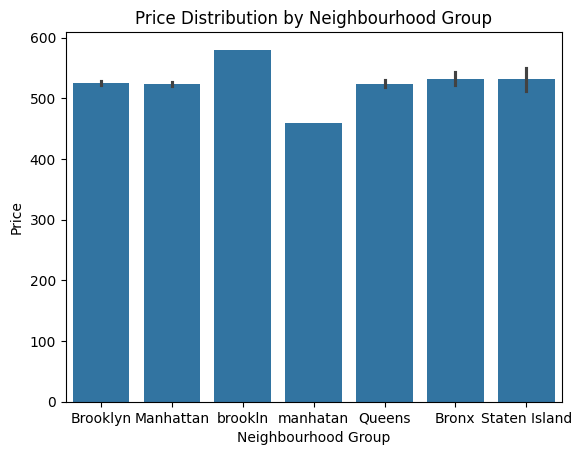

In [472]:
# Price variation based on Neighbourhood (Location)

sns.barplot(x='neighbourhood group', y='price', data=df)
plt.title('Price Distribution by Neighbourhood Group')
plt.xlabel('Neighbourhood Group')
plt.ylabel('Price')
plt.show()


In [473]:
# Visualising area wise the price distribution

fig = px.scatter_mapbox(df,
           lat="lat",
           lon="long",
           opacity = 0.3,
           hover_name="neighbourhood group",
           hover_data=["neighbourhood group", "price", "room type"],
           color="price",
           color_discrete_sequence=px.colors.sequential.PuBuGn,
           title = "Airbnb Price in NYC Neighbourhood Groups",
           )
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

### Feature Engineering: Converting categorical columns to numerical using One Hot Encoding and Handling zero values in 'minimum nights'

In [474]:
# Converting categorical columns to numerical using One Hot Encoding
df.dtypes
df_encoded = pd.get_dummies(df, columns=['host_identity_verified', 'neighbourhood group', 'instant_bookable', 'cancellation_policy', 'room type'])
df_encoded.columns

Index(['lat', 'long', 'Construction year', 'price', 'service fee',
       'minimum nights', 'number of reviews', 'reviews per month',
       'review rate number', 'calculated host listings count',
       'availability 365', 'host_identity_verified_unconfirmed',
       'host_identity_verified_verified', 'neighbourhood group_Bronx',
       'neighbourhood group_Brooklyn', 'neighbourhood group_Manhattan',
       'neighbourhood group_Queens', 'neighbourhood group_Staten Island',
       'neighbourhood group_brookln', 'neighbourhood group_manhatan',
       'instant_bookable_False', 'instant_bookable_True',
       'cancellation_policy_flexible', 'cancellation_policy_moderate',
       'cancellation_policy_strict', 'room type_Entire home/apt',
       'room type_Hotel room', 'room type_Private room',
       'room type_Shared room'],
      dtype='object')

In [475]:
df_encoded['minimum nights'] = df_encoded['minimum nights'].replace(0, 1)

#### Applying Machine Learning Models: Linear Regression, Decision Tree, Gradient Boosting
##### Train, Test, Split

In [476]:
X = df_encoded.drop('price', axis=1)
y = df_encoded['price']

In [477]:
# Splitting the data into a split of 80% train and 20% test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42) 

In [478]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [479]:
# Model 1: Linear Regression

lr_model = LinearRegression()
lr_model.fit(X_train_scaled, y_train)
lr_y_pred = lr_model.predict(X_test_scaled)

lr_mse = mean_squared_error(y_test, lr_y_pred)
lr_r2 = r2_score(y_test, lr_y_pred)
lr_mae = mean_absolute_error(y_test, lr_y_pred)
print(lr_mse, lr_r2, lr_mae)

156.23641467428936 0.9978986917208851 1.7168571078828652


In [480]:
# Model 2: Decision Tree

dt_model = DecisionTreeRegressor(max_depth=3)
dt_model.fit(X_train_scaled, y_train)
dt_y_pred = dt_model.predict(X_test_scaled)

dt_mse = mean_squared_error(y_test, dt_y_pred)
dt_r2 = r2_score(y_test, dt_y_pred)
dt_mae = mean_absolute_error(y_test, dt_y_pred)
print(dt_mse, dt_r2, dt_mae)

1335.3069171485804 0.9820407330390084 30.121721133436406


In [481]:
# Model 3: Gradient Boosting

gb_model = GradientBoostingRegressor(max_depth=3)
gb_model.fit(X_train_scaled, y_train)
gb_y_pred = gb_model.predict(X_test_scaled)

gb_mse = mean_squared_error(y_test, gb_y_pred)
gb_r2 = r2_score(y_test, gb_y_pred)
gb_mae = mean_absolute_error(y_test, gb_y_pred)
print(gb_mse, gb_r2, gb_mae)


159.8552382657792 0.9978500201996567 2.2669483207650383


In [482]:
# Results of the 3 Models

models_scores = pd.DataFrame({
    "Model": ["Linear Regression", "Decision Tree", "Gradient Boosting"],
    "MSE": [lr_mse, dt_mse, gb_mse],
    "R²": [lr_r2, dt_r2, gb_r2],
    "MAE": [lr_mae, dt_mae, gb_mae]
})

models_scores.set_index('Model', inplace=True)
models_scores 

,MSE,R²,MAE
Model,,,
Linear Regression,156.236415,0.997899,1.716857
Decision Tree,1335.306917,0.982041,30.121721
Gradient Boosting,159.855238,0.997850,2.266948
